In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
from matplotlib import rc
%matplotlib inline
from matplotlib import font_manager
plt.style.use('default')
f_path = "C:/windows/Fonts/malgun.ttf"
ko_font = font_manager.FontProperties(fname=f_path).get_name()
rc('font', family='Malgun Gothic')
#plt.title('테스트')

C:\Users\82102\anaconda3\lib\site-packages\scipy\__init__.py:177: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from shapely.geometry import Point

In [3]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

In [4]:
# 법정동 기준 장애인구 데이터 불러오기
dis_po_b = pd.read_csv('./장애인구/장애인구법정동.csv')

# 서울시 주거구역 데이터 불러오기
live = gpd.read_file('./용도지역/UPIS_C_UQ111.shp')

# 서울시 시군구 경계 데이터 불러오기
boundary = gpd.read_file('./경계/seoul_all.shp')

# 서울시 행정동 경계 데이터 불러오기
boundary_b = gpd.read_file('./법정동경계/seoul_dong.shp')

# 장애인 복지관 데이터 불러오기
wel_fac = gpd.read_file('./장애인복지관/장애인복지관.csv', encoding = 'utf-8')
wel_fac = gpd.GeoDataFrame(wel_fac, geometry=gpd.points_from_xy(wel_fac.x, wel_fac.y))
wel_fac = wel_fac.set_crs(epsg=4326)

In [5]:
# 용도지역 데이터에서 주거지역만 필터링
live = live[live['DGM_NM'].str.contains('주거', na = False)]

# 장애인구데이터와 법정동경계데이터 병합: EMD_NM과 법정동명을 기준으로 병합
dis_po_b['시군구코드'] = dis_po_b['시군구코드'].astype('str')
merge = boundary_b.merge(dis_po_b, left_on=['COL_ADM_SE','EMD_NM'], right_on=['시군구코드','법정동명'], how='left')
merge.drop(columns=['법정동명','시군구코드'], inplace=True)
merge.rename(columns={'num': 'disabled_population'}, inplace=True)

In [6]:
# 좌표계를 통일하기 위해 EPSG:4326 (WGS 84)로 설정
# boundary = boundary.to_crs(epsg=4326)
# live = live.to_crs(epsg=4326)
# #boundary_b = boundary_b.to_crs(epsg=4326)
 #wel_fac = wel_fac.to_crs(epsg=4326)

In [7]:
# 좌표계 통일
boundary = boundary.to_crs(epsg=32652)
boundary_b = boundary_b.to_crs(epsg=32652)
live = live.to_crs(epsg=32652)
wel_fac = wel_fac.to_crs(epsg=32652)
merge = merge.to_crs(epsg=32652)

## 주거지역 시각화

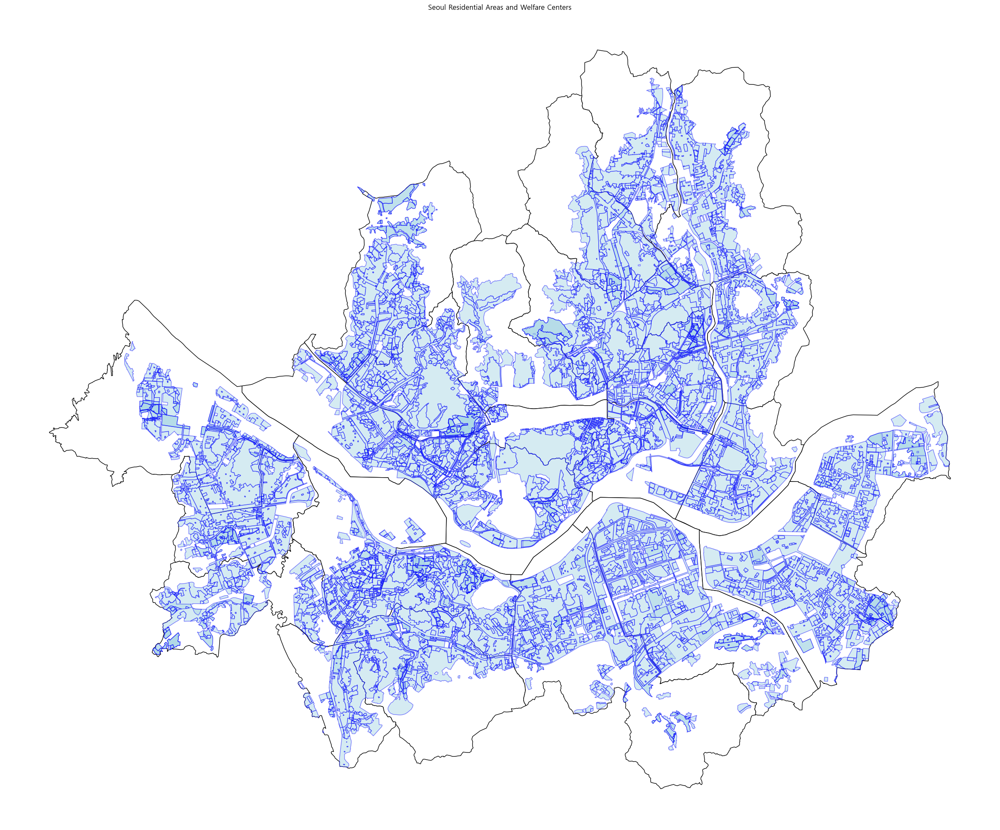

In [8]:
# 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 주거지역 시각화
live.plot(ax=ax, color='lightblue', alpha=0.5, edgecolor='blue')

# 제목 및 축 제거
plt.title('Seoul Residential Areas and Welfare Centers')
ax.set_axis_off()

plt.show()

## 장애인 복지관 시각화

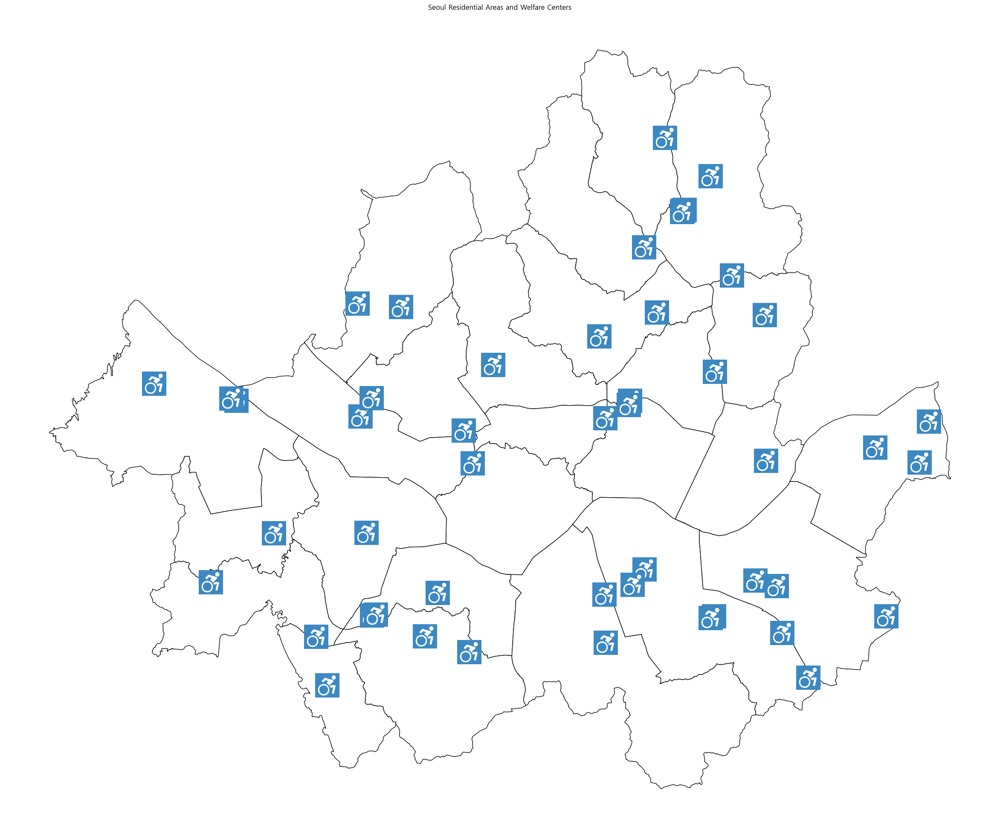

In [9]:
# 장애인 이모티콘 이미지 불러오기
emoji_path = './emoji/disabled_emoji.jpg'  # 이모티콘 이미지 파일 경로
img = plt.imread(emoji_path)

# 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 장애인 복지관 위치 시각화
for idx, row in wel_fac.iterrows():
    imagebox = OffsetImage(img, zoom=0.05)  # zoom 값을 조정하여 이미지 크기 조절
    ab = AnnotationBbox(imagebox, (row['geometry'].x, row['geometry'].y), frameon=False)
    ax.add_artist(ab)

# 제목 및 축 제거
plt.title('Seoul Residential Areas and Welfare Centers')
ax.set_axis_off()

plt.show()

## 장애인 복지관 서비스 권역(2km) 시각화

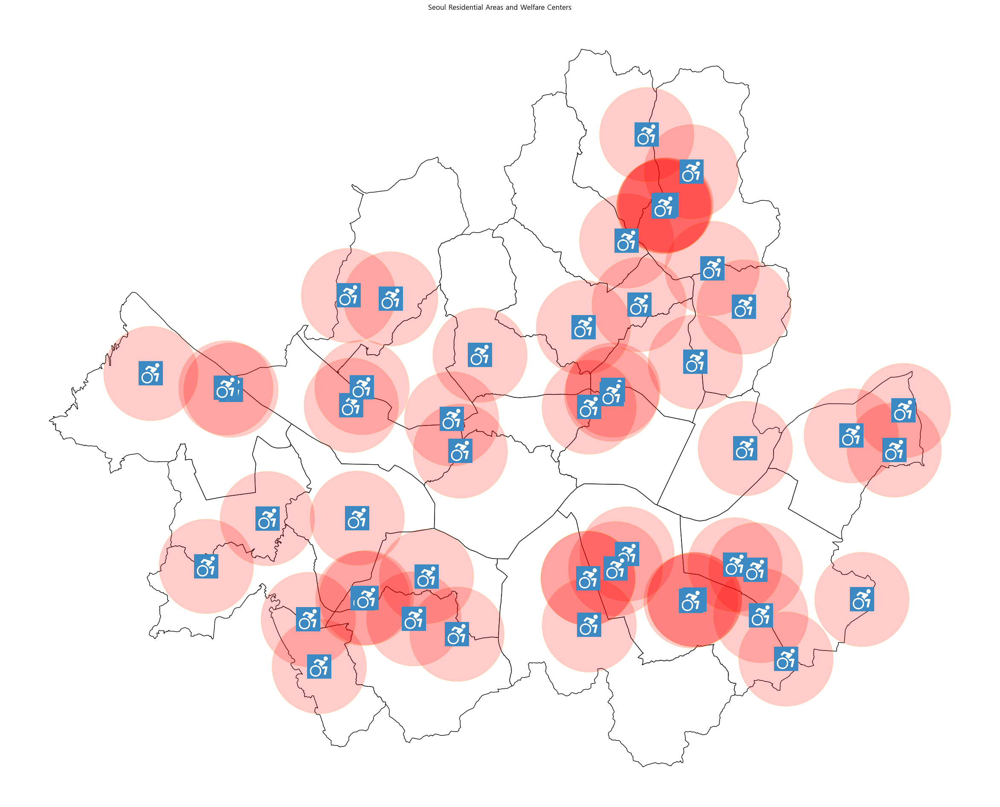

In [10]:
# 장애인 복지관 서비스 이용권역(2km) 생성
service_radius = 2000  # meters
wel_fac['buffer'] = wel_fac.geometry.buffer(service_radius)

# 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 장애인 복지관 서비스 이용권역 시각화
wel_fac.set_geometry('buffer').plot(ax=ax, color='red', alpha=0.2, edgecolor='orange')

# 장애인 복지관 위치 시각화
emoji_path = './emoji/disabled_emoji.jpg'  # 이모티콘 이미지 파일 경로
img = plt.imread(emoji_path)

for idx, row in wel_fac.iterrows():
    imagebox = OffsetImage(img, zoom=0.05)  # zoom 값을 조정하여 이미지 크기 조절
    ab = AnnotationBbox(imagebox, (row['geometry'].x, row['geometry'].y), frameon=False)
    ax.add_artist(ab)

# 제목 및 축 제거
plt.title('Seoul Residential Areas and Welfare Centers')
ax.set_axis_off()

plt.show()

## 주거지역 및 장애인 복지관 동시 시각화

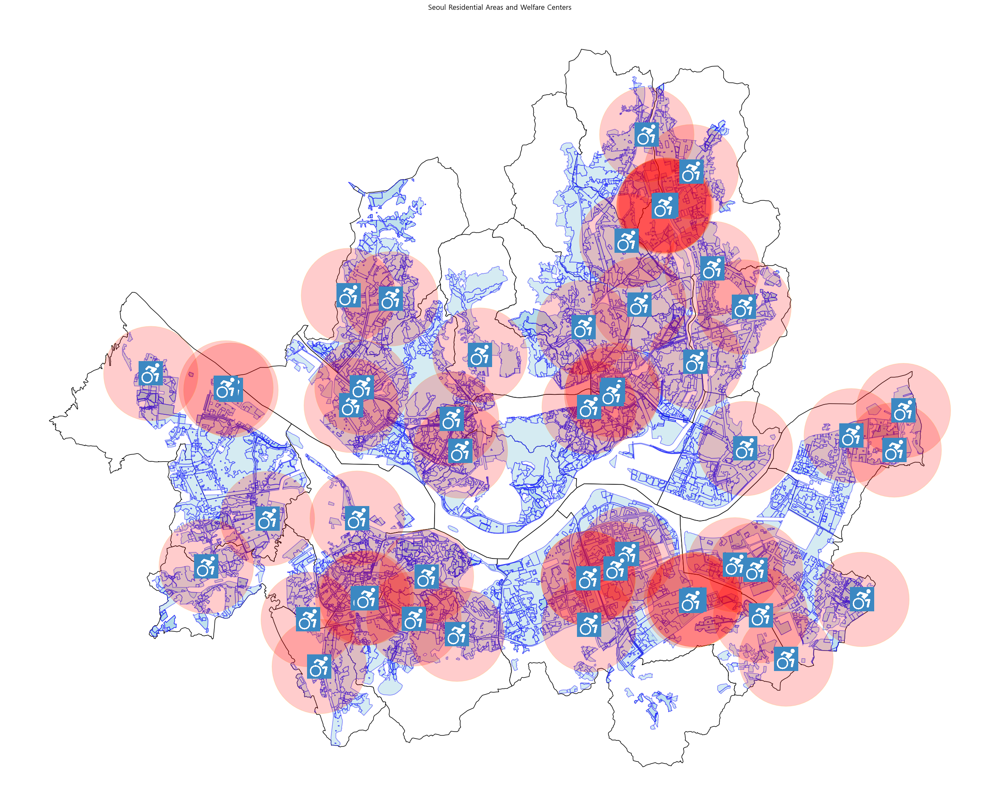

In [11]:
# 장애인 복지관 서비스 이용권역(2km) 생성
service_radius = 2000  # meters
wel_fac['buffer'] = wel_fac.geometry.buffer(service_radius)

# 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 주거지역 시각화
live.plot(ax=ax, color='lightblue', alpha=0.5, edgecolor='blue')

# 장애인 복지관 서비스 이용권역 시각화
wel_fac.set_geometry('buffer').plot(ax=ax, color='red', alpha=0.2, edgecolor='orange')

# 장애인 복지관 위치 시각화
emoji_path = './emoji/disabled_emoji.jpg'  # 이모티콘 이미지 파일 경로
img = plt.imread(emoji_path)

for idx, row in wel_fac.iterrows():
    imagebox = OffsetImage(img, zoom=0.05)  # zoom 값을 조정하여 이미지 크기 조절
    ab = AnnotationBbox(imagebox, (row['geometry'].x, row['geometry'].y), frameon=False)
    ax.add_artist(ab)

# 제목 및 축 제거
plt.title('Seoul Residential Areas and Welfare Centers')
ax.set_axis_off()

plt.show()

## 장애인구수 병합 후 인구 밀도 계산 및 시각화

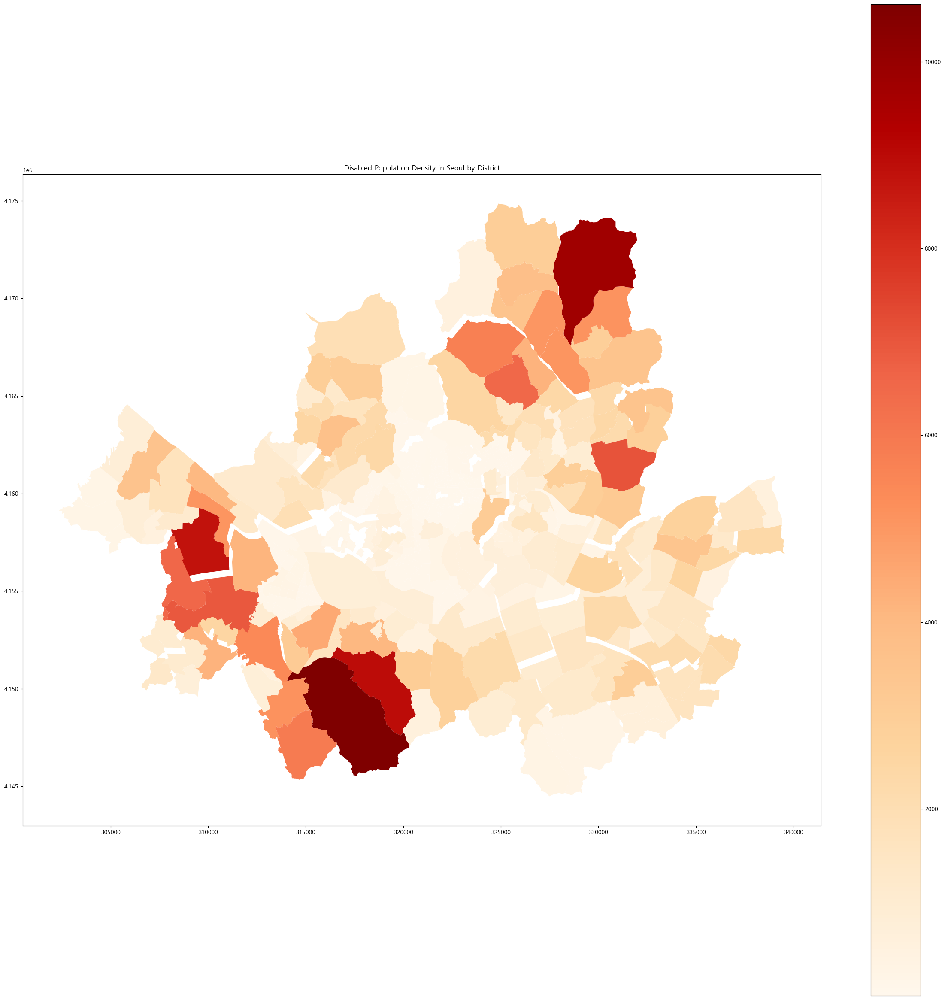

In [12]:
# 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 시각화
merge.plot(ax = ax, column='disabled_population', cmap='OrRd', legend=True)
plt.title('Disabled Population Density in Seoul by District')
plt.show()

## 인구 가중중심점 계산 후 시각화

In [13]:
# 인구 가중중심점 계산
merge['center_x'] = merge.centroid.x
merge['center_y'] = merge.centroid.y

# 가중중심점 계산 함수
def weighted_center(subset):
    x_sum = (subset['center_x'] * subset['disabled_population']).sum()
    y_sum = (subset['center_y'] * subset['disabled_population']).sum()
    total_population = subset['disabled_population'].sum()
    return pd.Series({'weighted_center_x': x_sum / total_population, 'weighted_center_y': y_sum / total_population})

weighted_center_x, weighted_center_y = weighted_center(merge)

# 행정구별 가중중심점 계산
weighted_centers = merge.groupby('시군구명').apply(weighted_center).reset_index()

C:\Users\82102\AppData\Local\Temp/ipykernel_31380/2111988624.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_centers = merge.groupby('시군구명').apply(weighted_center).reset_index()


In [14]:
# GeoDataFrame으로 변환
weighted_centers['geometry'] = weighted_centers.apply(lambda row: Point(row['weighted_center_x'], row['weighted_center_y']), axis=1)
weighted_centers = gpd.GeoDataFrame(weighted_centers, geometry='geometry', crs=32652)

C:\Users\82102\AppData\Local\Temp/ipykernel_31380/3125593370.py:19: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


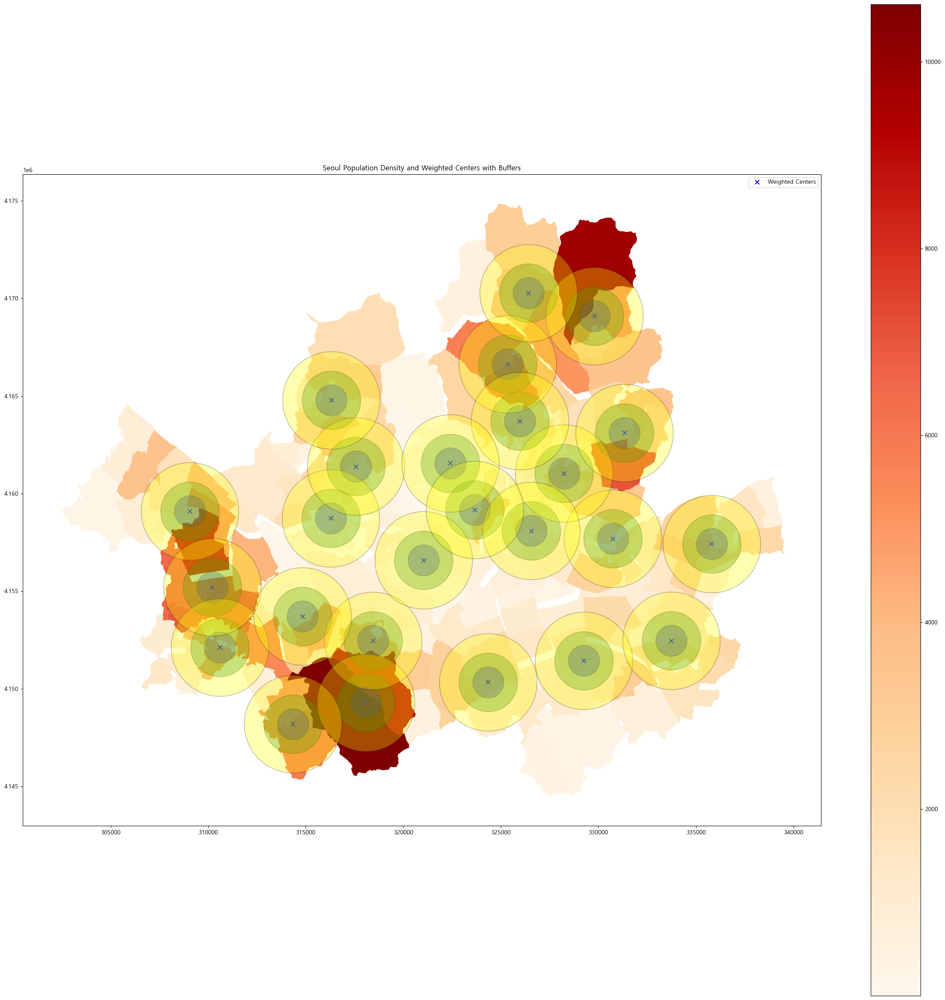

In [15]:
# 반경 원 그리기 함수
def plot_buffer(ax, gdf, buffer_radius, color, label):
    for idx, row in gdf.iterrows():
        circle = row.geometry.buffer(buffer_radius)
        gdf_circle = gpd.GeoDataFrame(geometry=[circle], crs=gdf.crs)
        gdf_circle.plot(ax=ax, color=color, alpha=0.3, edgecolor='k', label=label if idx == 0 else "")

# 서울시 행정동별 인구 밀도와 인구 가중중심점
fig, ax = plt.subplots(figsize=(30, 30))
merge.plot(column='disabled_population', ax=ax, legend=True, cmap='OrRd')
weighted_centers.plot(ax=ax, marker='x', color='blue', markersize=50, label='Weighted Centers')

# 0.8km, 1.5km, 2.5km 반경 원 그리기
plot_buffer(ax, weighted_centers, 800, 'blue', '0.8km Radius')
plot_buffer(ax, weighted_centers, 1500, 'green', '1.5km Radius')
plot_buffer(ax, weighted_centers, 2500, 'yellow', '2.5km Radius')

plt.title('Seoul Population Density and Weighted Centers with Buffers')
plt.legend()
plt.show()

C:\Users\82102\AppData\Local\Temp/ipykernel_31380/525482004.py:21: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


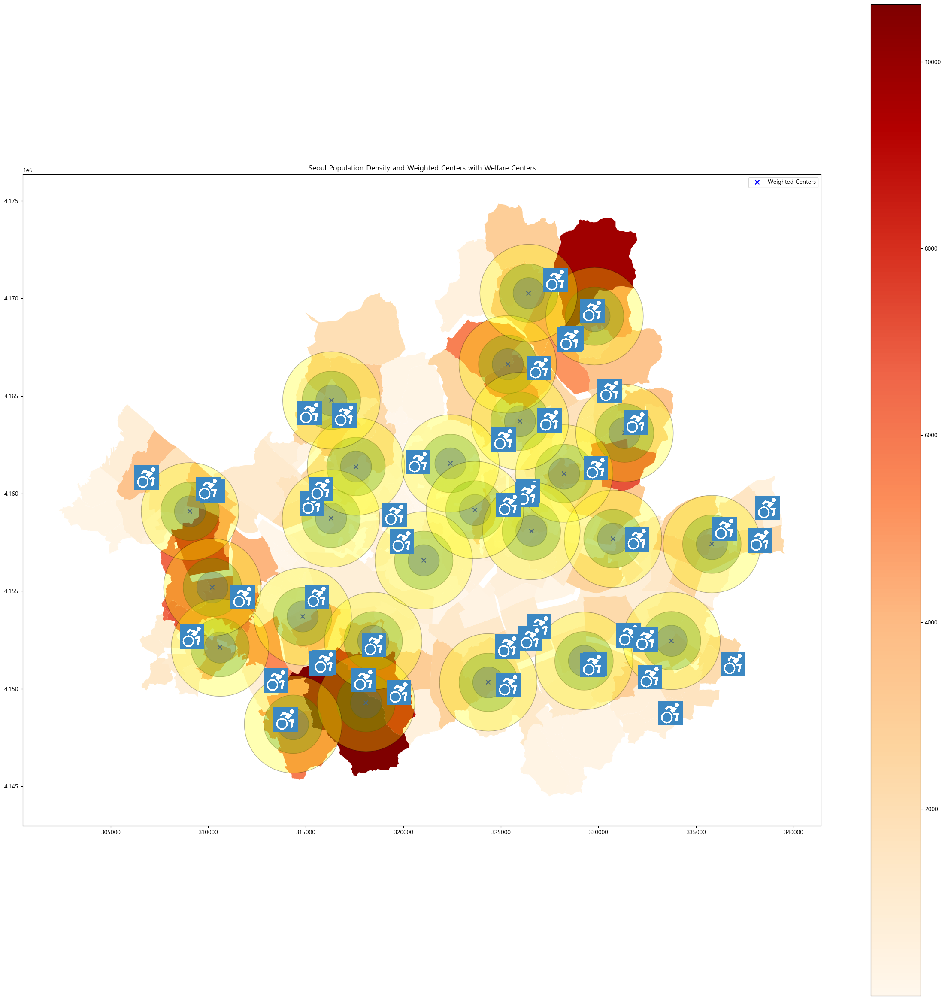

In [16]:
# 서울시 행정동별 인구 밀도와 인구 가중중심점
fig, ax = plt.subplots(figsize=(30, 30))
merge.plot(column='disabled_population', ax=ax, legend=True, cmap='OrRd')
weighted_centers.plot(ax=ax, marker='x', color='blue', markersize=50, label='Weighted Centers')

# 0.8km, 1.5km, 2.5km 반경 원 그리기
plot_buffer(ax, weighted_centers, 800, 'blue', '0.8km Radius')
plot_buffer(ax, weighted_centers, 1500, 'green', '1.5km Radius')
plot_buffer(ax, weighted_centers, 2500, 'yellow', '2.5km Radius')

# 장애인 복지관 위치 시각화
emoji_path = './emoji/disabled_emoji.jpg'  # 이모티콘 이미지 파일 경로
img = plt.imread(emoji_path)

for idx, row in wel_fac.iterrows():
    imagebox = OffsetImage(img, zoom=0.05)  # zoom 값을 조정하여 이미지 크기 조절
    ab = AnnotationBbox(imagebox, (row['geometry'].x, row['geometry'].y), frameon=False)
    ax.add_artist(ab)

plt.title('Seoul Population Density and Weighted Centers with Welfare Centers')
plt.legend()
plt.show()

## 반경 외의 복지관 수

In [17]:
# 각 인구 가중중심점으로부터 각 장애인 복지관의 거리를 계산하여 반경 외에 있는지 확인
def check_facilities_outside_radius(weighted_centers, wel_fac, radii):
    outside_facilities = {radius: set() for radius in radii}
    
    for idx, fac in wel_fac.iterrows():
        fac_point = fac.geometry
        for radius in radii:
            is_outside = True
            for _, center in weighted_centers.iterrows():
                center_point = center.geometry
                if fac_point.distance(center_point) <= radius:
                    is_outside = False
                    break
            if is_outside:
                outside_facilities[radius].add(fac['NAME'])
                
    return outside_facilities

# 반경 설정 (미터 단위)
radii = [800, 1500, 2500]

# 각 반경에 대해 반경 외에 있는 장애인 복지관 확인
outside_facilities = check_facilities_outside_radius(weighted_centers, wel_fac, radii)

# 각 반경에 대해 반경 외에 있는 장애인 복지관 수 출력
for radius in radii:
    count = len(outside_facilities[radius])
    print(f"{radius/1000:.1f}km 반경 외에 있는 장애인 복지관 수: {count}")

0.8km 반경 외에 있는 장애인 복지관 수: 45
1.5km 반경 외에 있는 장애인 복지관 수: 33
2.5km 반경 외에 있는 장애인 복지관 수: 9


In [18]:
def check_facilities_inside_radius(weighted_centers, wel_fac, radii):
    inside_facilities = {radius: set() for radius in radii}
    
    for idx, fac in wel_fac.iterrows():
        fac_point = fac.geometry
        for radius in radii:
            is_inside = False
            for _, center in weighted_centers.iterrows():
                center_point = center.geometry
                if fac_point.distance(center_point) <= radius:
                    is_inside = True
                    break
            if is_inside:
                inside_facilities[radius].add(fac['NAME'])
                
    return inside_facilities

# 반경 설정 (미터 단위)
radii = [800, 1500, 2500]

# 각 반경에 대해 반경 내에 있는 장애인 복지관 확인
inside_facilities = check_facilities_inside_radius(weighted_centers, wel_fac, radii)

# 각 반경에 대해 반경 내에 있는 장애인 복지관 수 출력
for radius in radii:
    count = len(inside_facilities[radius])
    print(f"{radius/1000:.1f}km 반경 내에 있는 장애인 복지관 수: {count}")

0.8km 반경 내에 있는 장애인 복지관 수: 7
1.5km 반경 내에 있는 장애인 복지관 수: 19
2.5km 반경 내에 있는 장애인 복지관 수: 43


In [19]:
def check_facilities_inside_radius(weighted_centers, wel_fac, radii):
    inside_facilities = {radius: {district: set() for district in weighted_centers['시군구명'].unique()} for radius in radii}
    
    for idx, fac in wel_fac.iterrows():
        fac_point = fac.geometry
        fac_district = fac['SGG_NM']
        for radius in radii:
            for _, center in weighted_centers.iterrows():
                center_point = center.geometry
                center_district = center['시군구명']
                if fac_district == center_district and fac_point.distance(center_point) <= radius:
                    inside_facilities[radius][fac_district].add(fac['NAME'])
                    break
                
    return inside_facilities

# 반경 설정 (미터 단위)
radii = [800, 1500, 2500]

# 각 반경에 대해 반경 내에 있는 장애인 복지관 확인
inside_facilities = check_facilities_inside_radius(weighted_centers, wel_fac, radii)

# 구별로 각 반경 내에 있는 장애인 복지관 수 계산
district_inside_facilities = {
    'SGG_NM': list(weighted_centers['시군구명'].unique())
}

for radius in radii:
    column_name = f'반경_{radius/1000:.1f}km_내'
    district_inside_facilities[column_name] = []
    for district in district_inside_facilities['SGG_NM']:
        count = len(inside_facilities[radius][district])
        district_inside_facilities[column_name].append(count)

# 데이터프레임 생성
district_inside_df = pd.DataFrame(district_inside_facilities)

# 총합 행을 데이터프레임에 추가
district_inside_df['Total'] = district_inside_df['반경_0.8km_내'] + district_inside_df['반경_1.5km_내'] + district_inside_df['반경_2.5km_내']
district_inside_df.sort_values(by='Total', ascending=False)

,SGG_NM,반경_0.8km_내,반경_1.5km_내,반경_2.5km_내,Total
0,강남구,3,3,3,9
8,노원구,1,1,5,7
21,은평구,0,2,2,4
14,서초구,0,1,3,4
17,송파구,0,1,2,3
16,성북구,0,1,2,3
1,강동구,0,1,2,3
11,동작구,1,1,1,3
24,중랑구,1,1,1,3
7,금천구,1,1,1,3


## 서비스 미 수혜 지역 시각화

### 1) 단순 인구 밀도 활용 미 수혜지역 확인

C:\Users\82102\AppData\Local\Temp/ipykernel_31380/2788028293.py:9: UserWarning: `keep_geom_type=True` in overlay resulted in 145 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  residential_density = gpd.overlay(merge, residential_minus_service, how='intersection')


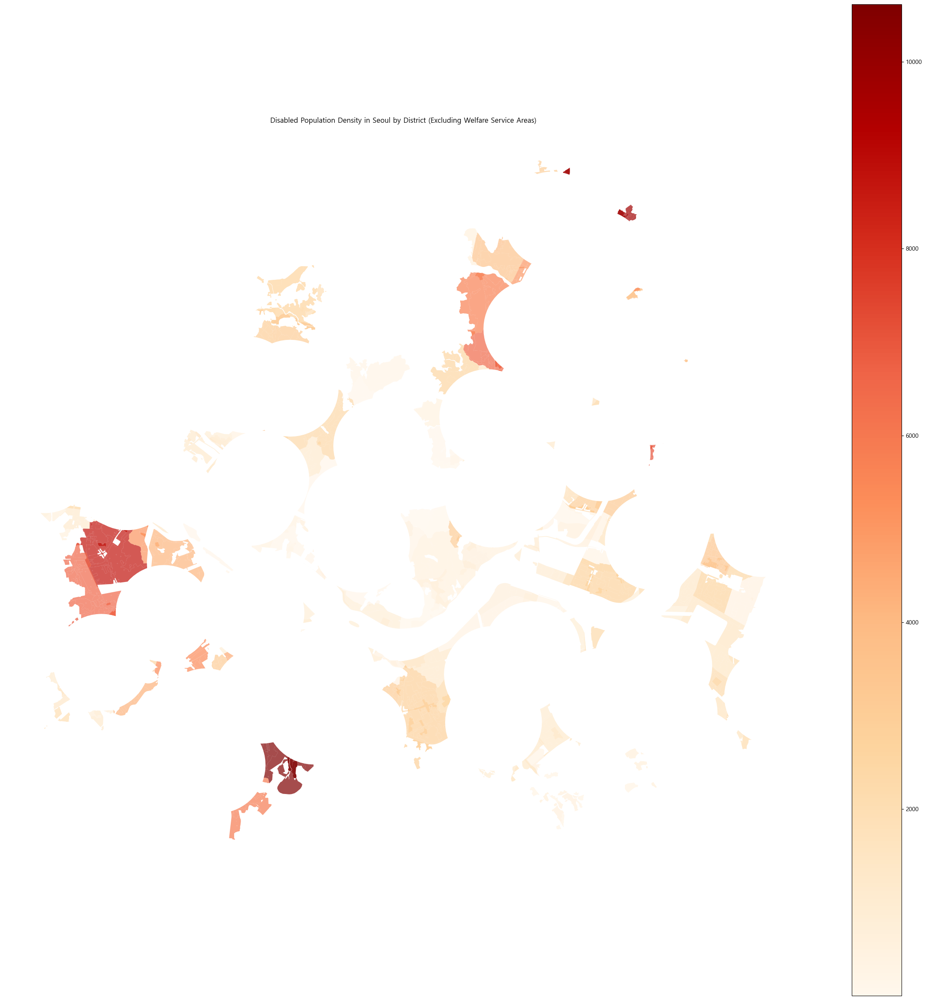

In [20]:
# 1. 장애인 복지관 서비스 이용권역 생성 (2km 반경)
service_radius = 2000  # meters
wel_fac['buffer'] = wel_fac.geometry.buffer(service_radius)

# 2. 주거지역에서 서비스 이용권역 제외한 부분 계산
residential_minus_service = gpd.overlay(live, wel_fac.set_geometry('buffer'), how='difference')

# 3. 인구 밀도 계산을 위해 merge 데이터프레임과 교차 영역 계산
residential_density = gpd.overlay(merge, residential_minus_service, how='intersection')

# 4. 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
#boundary.plot(ax=ax, color='white', edgecolor='black')

# 주거지역에서 서비스 이용권역 제외한 부분 시각화
residential_density.plot(ax=ax, column='disabled_population', cmap='OrRd', legend=True, alpha=0.7)

# 제목 및 축 제거
plt.title('Disabled Population Density in Seoul by District (Excluding Welfare Service Areas)')
ax.set_axis_off()

plt.show()

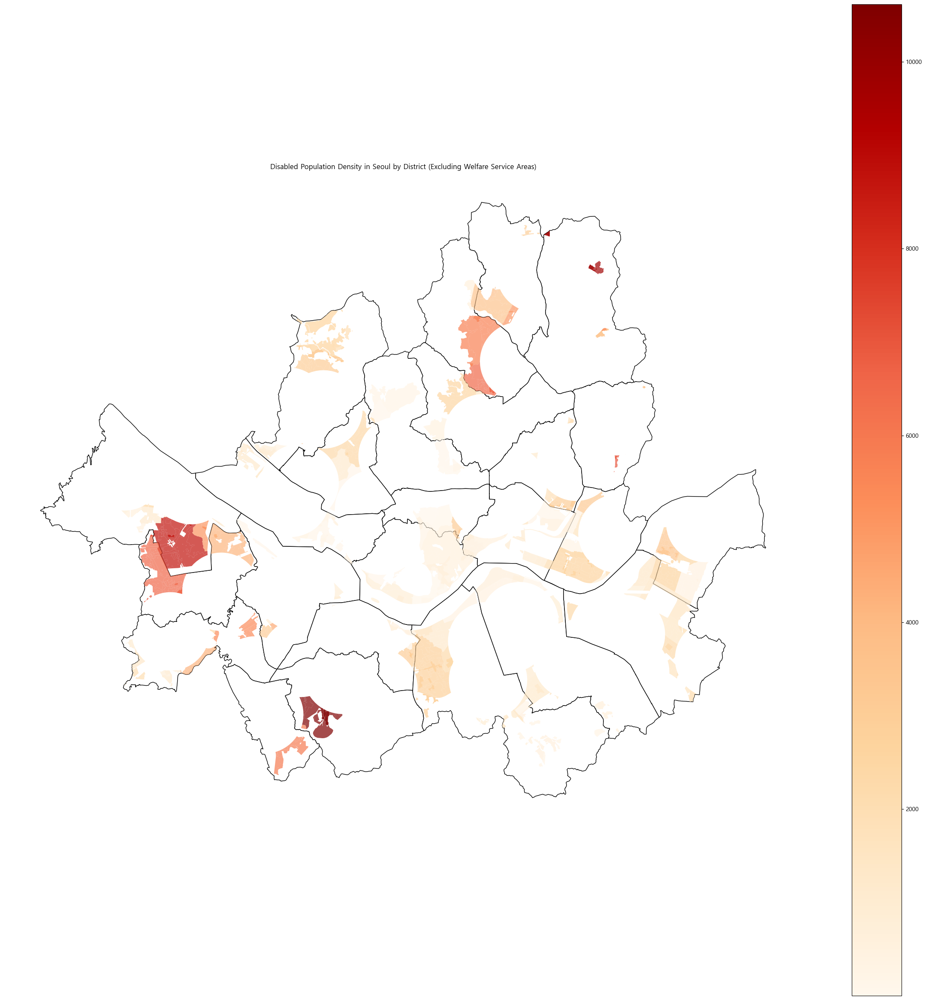

In [21]:
# 4. 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 주거지역에서 서비스 이용권역 제외한 부분 시각화
residential_density.plot(ax=ax, column='disabled_population', cmap='OrRd', legend=True, alpha=0.7)

# 제목 및 축 제거
plt.title('Disabled Population Density in Seoul by District (Excluding Welfare Service Areas)')
ax.set_axis_off()

plt.show()

### 2) 주거 지역 및 인구 밀도 활용 서비스 미수혜 지역 시각화

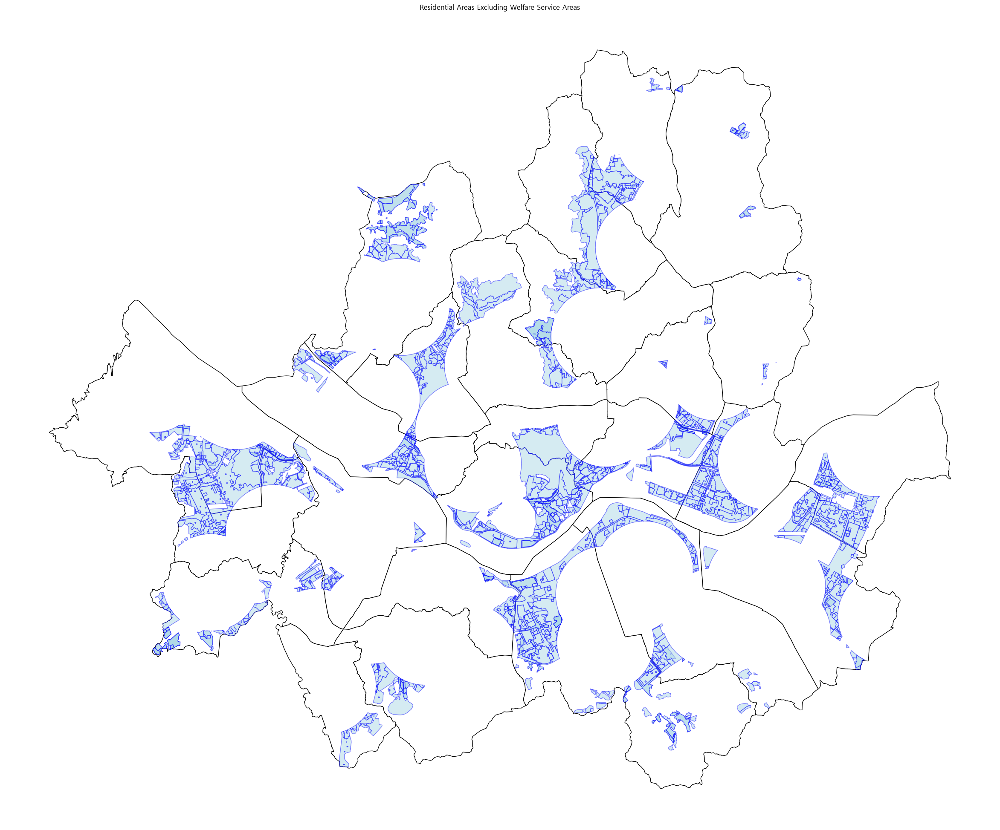

In [22]:
# 1. 장애인 복지관 서비스 이용권역 생성 (2km 반경)
service_radius = 2000  # meters
wel_fac['buffer'] = wel_fac.geometry.buffer(service_radius)

# 2. 주거지역에서 서비스 이용권역 제외한 부분 계산
residential_minus_service = gpd.overlay(live, wel_fac.set_geometry('buffer'), how='difference')

# 3. 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 주거지역에서 서비스 이용권역 제외한 부분 시각화
residential_minus_service.plot(ax=ax, color='lightblue', alpha=0.5, edgecolor='blue')

# 제목 및 축 제거
plt.title('Residential Areas Excluding Welfare Service Areas')
ax.set_axis_off()

plt.show()

C:\Users\82102\AppData\Local\Temp/ipykernel_31380/3676935432.py:9: UserWarning: `keep_geom_type=True` in overlay resulted in 145 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  residential_density = gpd.overlay(residential_minus_service, merge, how='intersection')


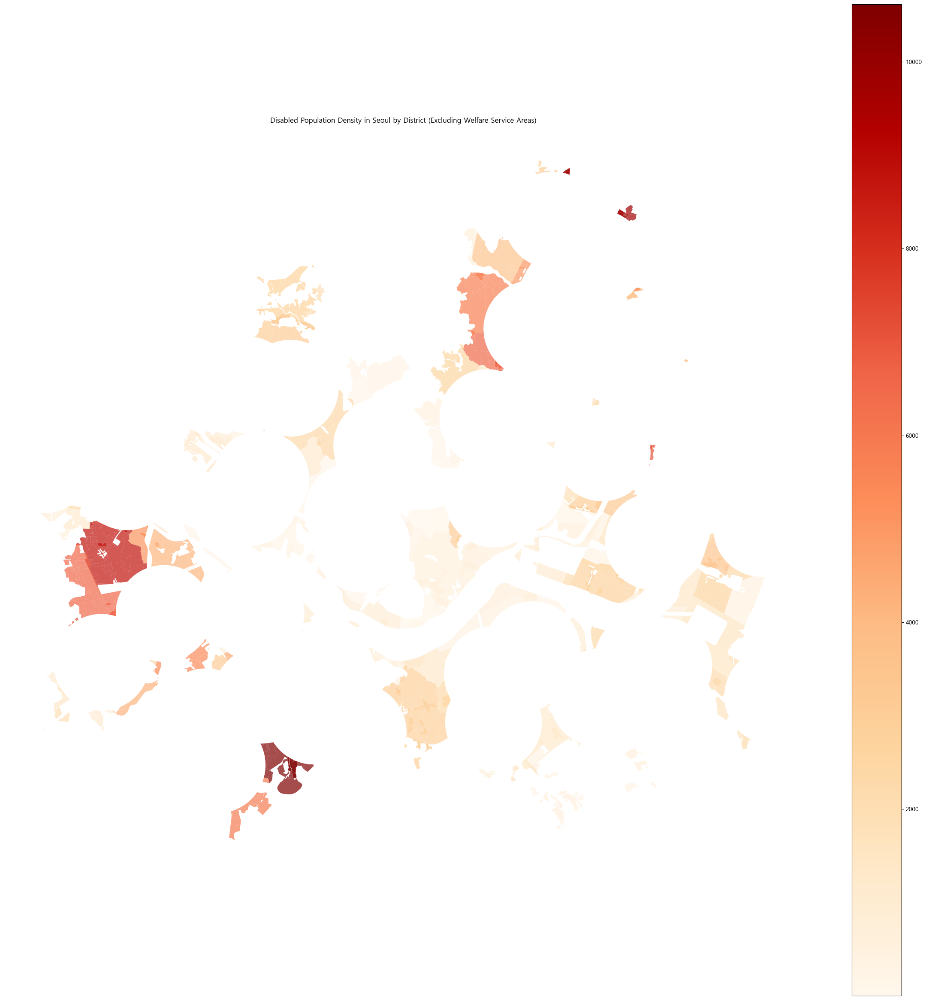

In [23]:
# 1. 장애인 복지관 서비스 이용권역 생성 (2km 반경)
service_radius = 2000  # meters
wel_fac['buffer'] = wel_fac.geometry.buffer(service_radius)

# 2. 주거지역에서 서비스 이용권역 제외한 부분 계산
residential_minus_service = gpd.overlay(live, wel_fac.set_geometry('buffer'), how='difference')

# 3. 인구 밀도 데이터와 주거지역 데이터 결합
residential_density = gpd.overlay(residential_minus_service, merge, how='intersection')

# 4. 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 주거지역에서 서비스 이용권역 제외한 부분의 인구 밀도 시각화
residential_density.plot(ax=ax, column='disabled_population', cmap='OrRd', legend=True, alpha=0.7)

# 제목 및 축 제거
plt.title('Disabled Population Density in Seoul by District (Excluding Welfare Service Areas)')
ax.set_axis_off()

plt.show()

C:\Users\82102\AppData\Local\Temp/ipykernel_31380/3119319899.py:9: UserWarning: `keep_geom_type=True` in overlay resulted in 145 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  residential_density = gpd.overlay(residential_minus_service, merge, how='intersection')


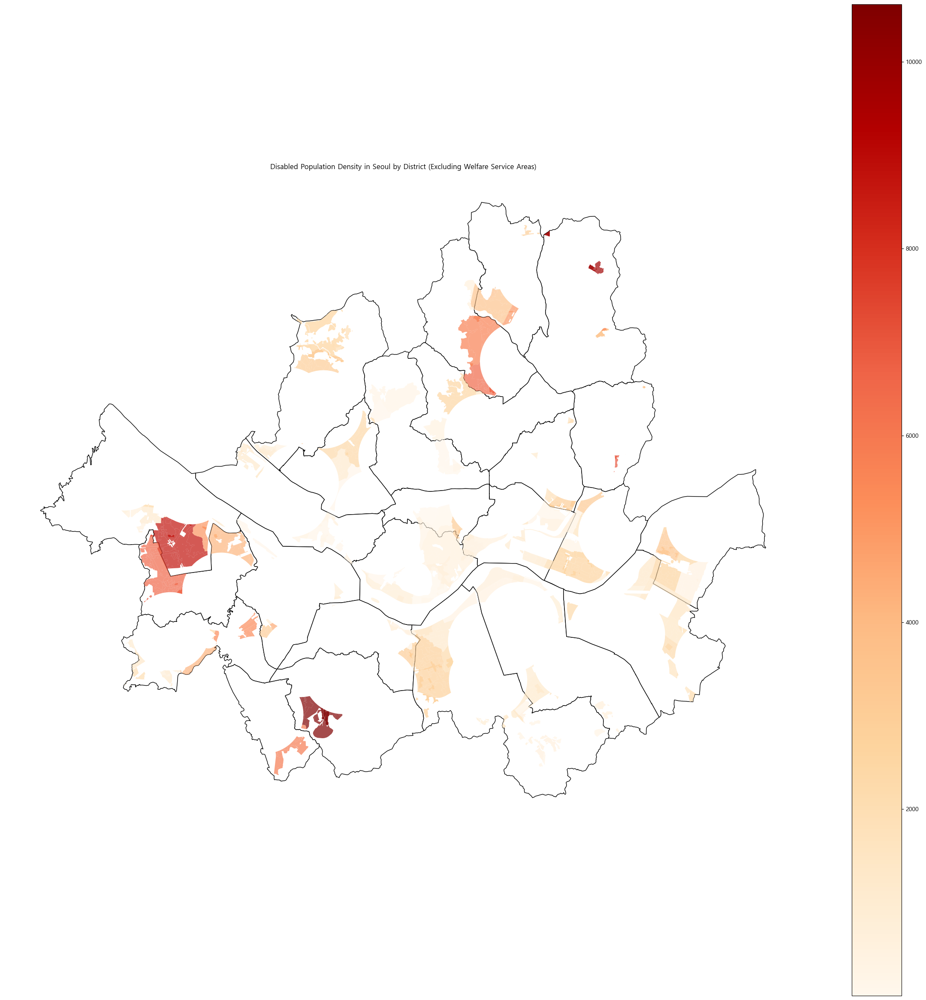

In [24]:
# 1. 장애인 복지관 서비스 이용권역 생성 (2km 반경)
service_radius = 2000  # meters
wel_fac['buffer'] = wel_fac.geometry.buffer(service_radius)

# 2. 주거지역에서 서비스 이용권역 제외한 부분 계산
residential_minus_service = gpd.overlay(live, wel_fac.set_geometry('buffer'), how='difference')

# 3. 인구 밀도 데이터와 주거지역 데이터 결합
residential_density = gpd.overlay(residential_minus_service, merge, how='intersection')

# 4. 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 주거지역에서 서비스 이용권역 제외한 부분의 인구 밀도 시각화
residential_density.plot(ax=ax, column='disabled_population', cmap='OrRd', legend=True, alpha=0.7)

# 제목 및 축 제거
plt.title('Disabled Population Density in Seoul by District (Excluding Welfare Service Areas)')
ax.set_axis_off()

plt.show()

## 구별 서비스 미수혜 지역 면적 계산 및 인구수 대비 계산

In [25]:
# 1. 장애인 복지관 서비스 이용권역 생성 (2km 반경)
service_radius = 2000  # meters
wel_fac['buffer'] = wel_fac.geometry.buffer(service_radius)

# 2. 주거지역에서 서비스 이용권역 제외한 부분 계산
residential_minus_service = gpd.overlay(live, wel_fac.set_geometry('buffer'), how='difference', keep_geom_type=True)

# 3. 인구 수 데이터와 주거지역 데이터 결합
residential_density = gpd.overlay(residential_minus_service, merge, how='intersection', keep_geom_type=True)

# 결합 과정에서 사라지는 주거지역 데이터 계산
residential_not_merged = gpd.overlay(residential_minus_service, merge, how='difference', keep_geom_type=True)

# 4. 시군구 정보와 결합
residential_density = gpd.sjoin(residential_density, boundary[['SGG_NM', 'geometry']], predicate='intersects', how='left')

# 5. 시군구별 중복되는 geometry 수만큼 나누어서 면적 계산, geometry를 문자열로 변환하여 동일한 geometry의 수 계산
residential_density['geometry_str'] = residential_density.geometry.apply(lambda x: x.wkt)
residential_density['geometry_count'] = residential_density.groupby('geometry_str')['geometry_str'].transform('count')
residential_density['area'] = residential_density.geometry.area
residential_density['area'] = residential_density['area'] / residential_density['geometry_count']

# 6. 시군구별 면적 합계
area_by_district = residential_density.groupby('SGG_NM')['area'].sum().reset_index()

# 7. 인구수 데이터는 (시군구명, EMD_NM)을 기준으로 중복되는 수만큼 나누어서 계산
residential_density['disabled_population_divided'] = residential_density['disabled_population'] / residential_density.groupby(['SGG_NM','EMD_NM'])['EMD_NM'].transform('count')

# 8. 시군구별 인구수와 면적 계산
density_by_district = residential_density.groupby('SGG_NM').agg({
    'disabled_population_divided': 'sum',
    'area': 'sum'
}).reset_index()

density_by_district['area_per_population'] = density_by_district['area'] / density_by_district['disabled_population_divided']

# 필요없는 열 삭제
residential_density.drop(columns=['geometry_str'], inplace=True)

# 9. 시군구 경계 데이터로부터 전체 면적 계산 및 최종 데이터프레임에 전체 면적 추가
boundary['total_area'] = boundary.geometry.area
density_by_district = density_by_district.merge(boundary[['SGG_NM', 'total_area']], on='SGG_NM', how='left')

# 10. 전체 면적 대비 미수혜면적 비율 및 예상되는 미수혜 장애인구수
density_by_district['미수혜비율'] = (density_by_district['area']/density_by_district['total_area'])*100
density_by_district['미수혜장애인구수'] = density_by_district['disabled_population_divided']*(density_by_district['미수혜비율']/100)

In [26]:
# 인구 수 데이터와 결합 과정에서 사라지는 주거지역 총 면적(고려하지못하는 곳)
residential_not_merged.geometry.area.sum()

5217537.924752839

In [27]:
# 시설 하나 당 장애인구 수용 비율 계산
density_by_district = density_by_district.sort_values(by='area', ascending=True)

# 시설당 장애인구수 시각화
fig = px.bar(density_by_district, x='area', y='SGG_NM',
             labels={'시군구': '시군구', '미수혜면적': '미수혜면적'},
             title='시군구별 미수혜면적')

fig.update_layout(
    yaxis=dict(
        tickmode='linear',
        automargin=True
    )
)

fig.update_layout(xaxis_tickformat=',d')

# 그래프 출력
fig.show()

In [28]:
# 시설 하나 당 장애인구 수용 비율 계산
density_by_district = density_by_district.sort_values(by='area_per_population', ascending=True)

# 시설당 장애인구수 시각화
fig = px.bar(density_by_district, x='area_per_population', y='SGG_NM',
             labels={'시군구': '시군구', '인구수대비미수혜면적': '인구수대비미수혜면적'},
             title='시군구별 인구수대비미수혜면적')

fig.update_layout(
    yaxis=dict(
        tickmode='linear',
        automargin=True
    )
)

fig.update_layout(xaxis_tickformat=',d')

# 그래프 출력
fig.show()

In [29]:
# 시설 하나 당 장애인구 수용 비율 계산
density_by_district = density_by_district.sort_values(by='미수혜비율', ascending=True)

# 시설당 장애인구수 시각화
fig = px.bar(density_by_district, x='미수혜비율', y='SGG_NM',
             labels={'시군구': '시군구', '미수혜비율': '미수혜비율'},
             title='시군구별 미수혜비율')

fig.update_layout(
    yaxis=dict(
        tickmode='linear',
        automargin=True
    )
)

fig.update_layout(xaxis_tickformat=',d')

# 그래프 출력
fig.show()

In [30]:
# 시설 하나 당 장애인구 수용 비율 계산
density_by_district = density_by_district.sort_values(by='미수혜장애인구수', ascending=True)

# 시설당 장애인구수 시각화
fig = px.bar(density_by_district, x='미수혜장애인구수', y='SGG_NM',
             labels={'시군구': '시군구', '미수혜장애인구수': '미수혜장애인구수'},
             title='시군구별 예상되는 미수혜 장애인구')

fig.update_layout(
    yaxis=dict(
        tickmode='linear',
        automargin=True
    )
)

fig.update_layout(xaxis_tickformat=',d')

# 그래프 출력
fig.show()

**총 미수혜 장애인구수**

In [31]:
sum(density_by_district['미수혜장애인구수'])

59160.0610235054

**총 미수혜 면적**

In [32]:
sum(density_by_district['area'])

93748950.33981031

## 가중중심점 기반 최적 입지 선정

- 자치구 별, 주거지역에 따른 장애인구수를 활용한 인구가중중심점

In [33]:
# 중심 좌표 계산
residential_density['center_x'] = residential_density.centroid.x
residential_density['center_y'] = residential_density.centroid.y

# 가중 중심점 계산 함수
def weighted_center(subset):
    x_sum = (subset['center_x'] * subset['disabled_population_divided']).sum()
    y_sum = (subset['center_y'] * subset['disabled_population_divided']).sum()
    total_population = subset['disabled_population_divided'].sum()
    return pd.Series({'weighted_center_x': x_sum / total_population, 'weighted_center_y': y_sum / total_population})

# 행정구별 가중 중심점 계산
weighted_centers = residential_density.groupby('시군구명').apply(weighted_center).reset_index()

# 가중 중심점을 Point 객체로 변환
weighted_centers['geometry'] = weighted_centers.apply(lambda row: Point(row['weighted_center_x'], row['weighted_center_y']), axis=1)
weighted_centers = gpd.GeoDataFrame(weighted_centers, geometry='geometry', crs=residential_density.crs)

C:\Users\82102\AppData\Local\Temp/ipykernel_31380/2395070285.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [34]:
#density_by_district에서 미수혜 장애인구수가 가장 높은 5개 구 추출
top_5_districts = density_by_district.nlargest(5, '미수혜장애인구수')['SGG_NM']

# weighted_centers에서 top_5_districts에 해당하는 행만 추출
top_5_weighted_centers = weighted_centers[weighted_centers['시군구명'].isin(top_5_districts)]


In [35]:
top_5_weighted_centers

,시군구명,weighted_center_x,weighted_center_y,geometry
2,강북구,325039.862823,4.166751e+06,POINT (325039.863 4166750.642)
3,강서구,309307.823883,4.157494e+06,POINT (309307.824 4157493.877)
15,성동구,327121.891698,4.157423e+06,POINT (327121.892 4157423.248)
18,양천구,309841.785038,4.156054e+06,POINT (309841.785 4156053.671)
20,용산구,322162.589734,4.156652e+06,POINT (322162.59 4156652.452)


In [36]:
top_5_weighted_centers = top_5_weighted_centers[['시군구명', 'geometry']]
top_5_weighted_centers.columns = ['SGG_NM','geometry']
top_5_weighted_centers['복지관유형'] = '신규'

wel_fac['복지관유형'] = '기존'

C:\Users\82102\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [37]:
# wel_fac에 top_5_weighted_centers 추가
wel_fac_extended = gpd.GeoDataFrame(pd.concat([wel_fac, top_5_weighted_centers], ignore_index=True))

## 추가된 시설로 시각화

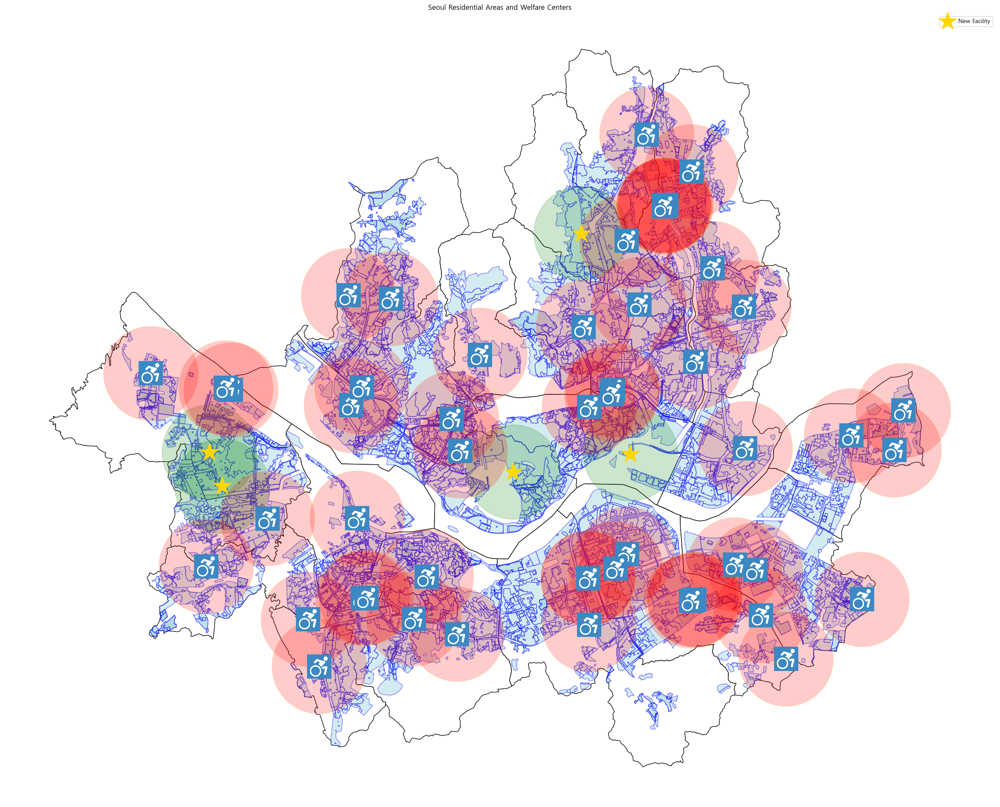

In [38]:
# 장애인 복지관 서비스 이용권역(2km) 생성
service_radius = 2000  # meters
wel_fac_extended['buffer'] = wel_fac_extended.geometry.buffer(service_radius)

# 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 주거지역 시각화
live.plot(ax=ax, color='lightblue', alpha=0.5, edgecolor='blue')

# 이모티콘 이미지 파일 경로
emoji_path = './emoji/disabled_emoji.jpg'
img = plt.imread(emoji_path)

# 복지관 유형이 '신규'인 경우와 아닌 경우로 나누기
new_facilities = wel_fac_extended[wel_fac_extended['복지관유형'] == '신규']
existing_facilities = wel_fac_extended[wel_fac_extended['복지관유형'] != '신규']

# 신규 복지관 서비스 이용권역 시각화 (초록색)
new_facilities.set_geometry('buffer').plot(ax=ax, color='green', alpha=0.2, edgecolor='green')

# 기존 복지관 서비스 이용권역 시각화 (빨간색)
existing_facilities.set_geometry('buffer').plot(ax=ax, color='red', alpha=0.2, edgecolor='orange')

# 신규 복지관 시각화 (별 마크)
ax.scatter(new_facilities.geometry.x, new_facilities.geometry.y, color='gold', marker='*', s=1000, label='New Facility')

# 기존 복지관 시각화 (이모티콘)
for idx, row in existing_facilities.iterrows():
    imagebox = OffsetImage(img, zoom=0.05)
    ab = AnnotationBbox(imagebox, (row['geometry'].x, row['geometry'].y), frameon=False)
    ax.add_artist(ab)

# 제목 및 축 제거
plt.title('Seoul Residential Areas and Welfare Centers')
ax.set_axis_off()

plt.legend()
plt.show()

C:\Users\82102\AppData\Local\Temp/ipykernel_31380/3873062049.py:9: UserWarning:

`keep_geom_type=True` in overlay resulted in 91 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries



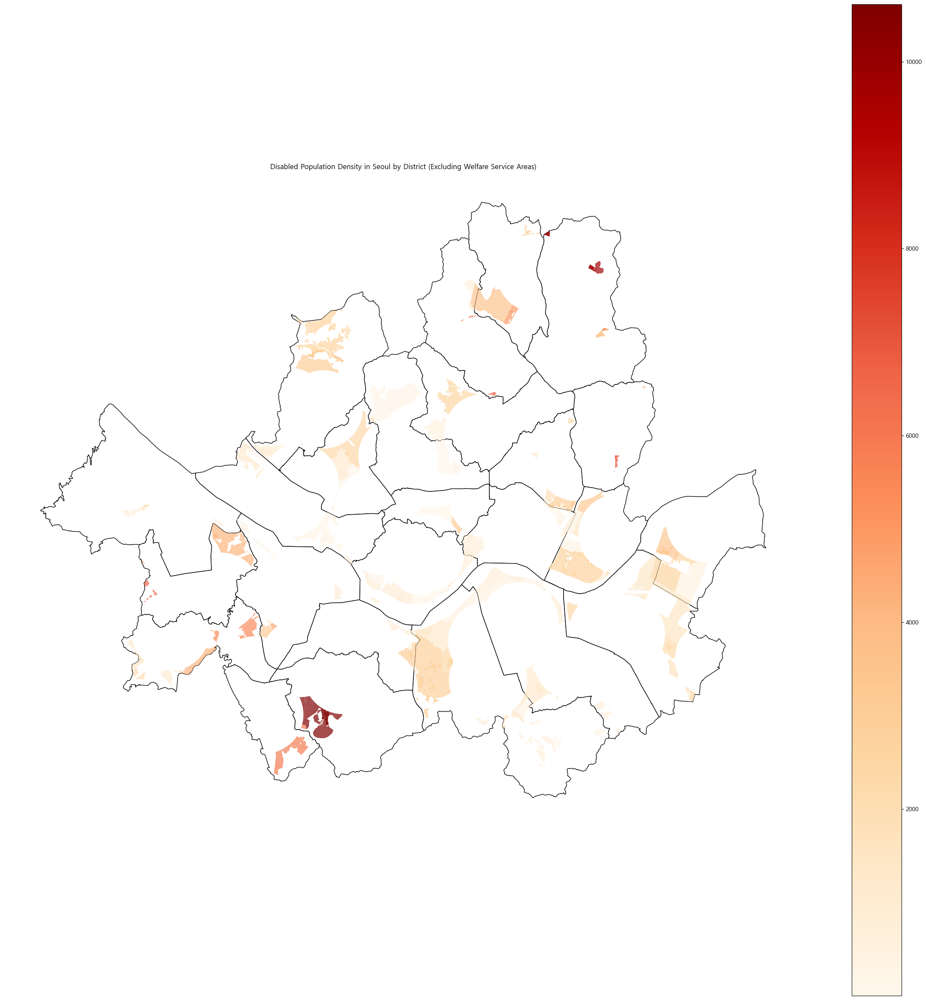

In [39]:
# 1. 장애인 복지관 서비스 이용권역 생성 (2km 반경)
service_radius = 2000  # meters
wel_fac_extended['buffer'] = wel_fac_extended.geometry.buffer(service_radius)

# 2. 주거지역에서 서비스 이용권역 제외한 부분 계산
residential_minus_service = gpd.overlay(live, wel_fac_extended.set_geometry('buffer'), how='difference')

# 3. 인구 밀도 데이터와 주거지역 데이터 결합
residential_density = gpd.overlay(residential_minus_service, merge, how='intersection')

# 4. 시각화
fig, ax = plt.subplots(figsize=(30, 30))

# 행정구역 경계 시각화
boundary.plot(ax=ax, color='white', edgecolor='black')

# 주거지역에서 서비스 이용권역 제외한 부분의 인구 밀도 시각화
residential_density.plot(ax=ax, column='disabled_population', cmap='OrRd', legend=True, alpha=0.7)

# 제목 및 축 제거
plt.title('Disabled Population Density in Seoul by District (Excluding Welfare Service Areas)')
ax.set_axis_off()

plt.show()

In [40]:
# 1. 장애인 복지관 서비스 이용권역 생성 (2km 반경)
service_radius = 2000  # meters
wel_fac_extended['buffer'] = wel_fac_extended.geometry.buffer(service_radius)

# 2. 주거지역에서 서비스 이용권역 제외한 부분 계산
residential_minus_service = gpd.overlay(live, wel_fac_extended.set_geometry('buffer'), how='difference', keep_geom_type=True)

# 3. 인구 수 데이터와 주거지역 데이터 결합
residential_density = gpd.overlay(residential_minus_service, merge, how='intersection', keep_geom_type=True)

# 결합 과정에서 사라지는 주거지역 데이터 계산
residential_not_merged = gpd.overlay(residential_minus_service, merge, how='difference', keep_geom_type=True)

# 4. 시군구 정보와 결합
residential_density = gpd.sjoin(residential_density, boundary[['SGG_NM', 'geometry']], predicate='intersects', how='left')

# 5. 시군구별 중복되는 geometry 수만큼 나누어서 면적 계산, geometry를 문자열로 변환하여 동일한 geometry의 수 계산
residential_density['geometry_str'] = residential_density.geometry.apply(lambda x: x.wkt)
residential_density['geometry_count'] = residential_density.groupby('geometry_str')['geometry_str'].transform('count')
residential_density['area'] = residential_density.geometry.area
residential_density['area'] = residential_density['area'] / residential_density['geometry_count']

# 6. 시군구별 면적 합계
area_by_district = residential_density.groupby('SGG_NM')['area'].sum().reset_index()

# 7. 인구수 데이터는 (시군구명, EMD_NM)을 기준으로 중복되는 수만큼 나누어서 계산
residential_density['disabled_population_divided'] = residential_density['disabled_population'] / residential_density.groupby(['SGG_NM','EMD_NM'])['EMD_NM'].transform('count')

# 8. 시군구별 인구수와 면적 계산
density_by_district = residential_density.groupby('SGG_NM').agg({
    'disabled_population_divided': 'sum',
    'area': 'sum'
}).reset_index()

density_by_district['area_per_population'] = density_by_district['area'] / density_by_district['disabled_population_divided']

# 필요없는 열 삭제
residential_density.drop(columns=['geometry_str'], inplace=True)

# 9. 시군구 경계 데이터로부터 전체 면적 계산 및 최종 데이터프레임에 전체 면적 추가
boundary['total_area'] = boundary.geometry.area
density_by_district = density_by_district.merge(boundary[['SGG_NM', 'total_area']], on='SGG_NM', how='left')

# 10. 전체 면적 대비 미수혜면적 비율 및 예상되는 미수혜 장애인구수
density_by_district['미수혜비율'] = (density_by_district['area']/density_by_district['total_area'])*100
density_by_district['미수혜장애인구수'] = density_by_district['disabled_population_divided']*(density_by_district['미수혜비율']/100)

In [41]:
# 시설 하나 당 장애인구 수용 비율 계산
density_by_district = density_by_district.sort_values(by='area', ascending=True)

# 시설당 장애인구수 시각화
fig = px.bar(density_by_district, x='area', y='SGG_NM',
             labels={'시군구': '시군구', '미수혜면적': '미수혜면적'},
             title='시군구별 미수혜면적')

fig.update_layout(
    yaxis=dict(
        tickmode='linear',
        automargin=True
    )
)

fig.update_layout(xaxis_tickformat=',d')

# 그래프 출력
fig.show()

In [42]:
# 시설 하나 당 장애인구 수용 비율 계산
density_by_district = density_by_district.sort_values(by='area_per_population', ascending=True)

# 시설당 장애인구수 시각화
fig = px.bar(density_by_district, x='area_per_population', y='SGG_NM',
             labels={'시군구': '시군구', '인구수대비미수혜면적': '인구수대비미수혜면적'},
             title='시군구별 인구수대비미수혜면적')

fig.update_layout(
    yaxis=dict(
        tickmode='linear',
        automargin=True
    )
)

fig.update_layout(xaxis_tickformat=',d')

# 그래프 출력
fig.show()

In [43]:
# 시설 하나 당 장애인구 수용 비율 계산
density_by_district = density_by_district.sort_values(by='미수혜비율', ascending=True)

# 시설당 장애인구수 시각화
fig = px.bar(density_by_district, x='미수혜비율', y='SGG_NM',
             labels={'시군구': '시군구', '미수혜비율': '미수혜비율'},
             title='시군구별 미수혜비율')

fig.update_layout(
    yaxis=dict(
        tickmode='linear',
        automargin=True
    )
)

fig.update_layout(xaxis_tickformat=',d')

# 그래프 출력
fig.show()

In [44]:
# 시설 하나 당 장애인구 수용 비율 계산
density_by_district = density_by_district.sort_values(by='미수혜장애인구수', ascending=True)

# 시설당 장애인구수 시각화
fig = px.bar(density_by_district, x='미수혜장애인구수', y='SGG_NM',
             labels={'시군구': '시군구', '미수혜장애인구수': '미수혜장애인구수'},
             title='시군구별 예상되는 미수혜 장애인구')

fig.update_layout(
    yaxis=dict(
        tickmode='linear',
        automargin=True
    )
)

fig.update_layout(xaxis_tickformat=',d')

# 그래프 출력
fig.show()

**총 미수혜 면적**

In [45]:
sum(density_by_district['미수혜장애인구수'])

34849.58839623064

**총 미수혜 면적**

In [46]:
sum(density_by_district['area'])

69901628.42109405